<img src="NotebookAddons/blackboard-banner.png" width="100%" />
<font face="Calibri">
<br>
<font size="7"> <b> GEOS 657: Microwave Remote Sensing<b> </font>

<font size="5"> <b>Lab 4: Exploring SAR Data and SAR Time Series Analysis using Jupyter Notebooks <font color='rgba(200,0,0,0.2)'> -- [20 Points] </font> </b> </font>

<br>
<font size="4"> <b> Franz J Meyer; University of Alaska Fairbanks & Josef Kellndorfer, <a href="http://earthbigdata.com/" target="_blank">Earth Big Data, LLC</a> </b> <br>
<img style="padding:7px;" src="NotebookAddons/UAFLogo_A_647.png" width="170" align="right" /><font color='rgba(200,0,0,0.2)'> <b>Assignment Due Date: </b> March 15, 2021 </font>
</font>

<font size="3"> This Lab is part of the UAF course <a href="https://radar.community.uaf.edu/" target="_blank">GEOS 657: Microwave Remote Sensing</a>. It introduces you to the analysis of deep multi-temporal SAR image data stacks in the framework of *Jupyter Notebooks*. The Jupyter Notebook environment is easy to launch in any web browser for interactive data exploration with provided or new training data. Notebooks are comprised of text written in a combination of executable python code and markdown formatting including latex style mathematical equations. Another advantage of Jupyter Notebooks is that they can easily be expanded, changed, and shared with new data sets or newly available time series steps. Therefore, they provide an excellent basis for collaborative and repeatable data analysis. <br>

<b>In this chapter we introduce the following data analysis concepts:</b>

- How to load time series stacks into Jupyter Notebooks and how to explore image content using basic functions such as mean value calculation and histogram analysis.
- How to apply calibration constants to covert initial digital number (DN) data into calibrated radar cross section information.
- How to subset images create time series information of calibrated SAR amplitude values.
- How to explore the time-series information in SAR data stacks for environmental analysis.
</font>


<hr>

# 0. Importing Relevant Python Packages

<font face="Calibri">

<font size="3">In this notebook we will use the following scientific libraries:
<ol type="1">
    <li> <b><a href="https://pandas.pydata.org/" target="_blank">Pandas</a></b> is a Python library that provides high-level data structures and a vast variety of tools for analysis. The great feature of this package is the ability to translate rather complex operations with data into one or two commands. Pandas contains many built-in methods for filtering and combining data, as well as the time-series functionality. </li>
    <li> <b><a href="https://www.gdal.org/" target="_blank">GDAL</a></b> is a software library for reading and writing raster and vector geospatial data formats. It includes a collection of programs tailored for geospatial data processing. Most modern GIS systems (such as ArcGIS or QGIS) use GDAL in the background.</li>
    <li> <b><a href="http://www.numpy.org/" target="_blank">NumPy</a></b> is one of the principal packages for scientific applications of Python. It is intended for processing large multidimensional arrays and matrices, and an extensive collection of high-level mathematical functions and implemented methods makes it possible to perform various operations with these objects. </li>
    <li> <b><a href="https://matplotlib.org/index.html" target="_blank">Matplotlib</a></b> is a low-level library for creating two-dimensional diagrams and graphs. With its help, you can build diverse charts, from histograms and scatterplots to non-Cartesian coordinates graphs. Moreover, many popular plotting libraries are designed to work in conjunction with matplotlib. </li>
    <li> <b><a href="https://github.com/asfadmin/asf-jupyter-notebooks" target="_blank">asf_notebook</a></b> is a set of python utilities put together by the <a href="https://asf.alaska.edu/" target="_blank">Alaska Satellite Facility (ASF)</a> to make accessing and working with ASF SAR Data a bit easier. Utilities include discovering and fetching of ASF products as well as easy mechanisms to create and navigate the OpenSARLab folder structure. </li>

</font>
<br>
<font face="Calibri" size="3"> Our first step is to <b>import them:</b> </font>

In [67]:
%%capture
import os, glob # for chdir, getcwd, path.basename, path.exists

import pandas as pd # for DatetimeIndex
from osgeo import gdal # for GetRasterBand, Open, ReadAsArray
import numpy as np #for log10, mean, percentile, power
import matplotlib.pylab as plb # for add_patch, add_subplot, figure, hist, imshow, set_title, xaxis,_label, text 
import matplotlib.pyplot as plt # for add_subplot, axis, figure, imshow, legend, plot, set_axis_off, set_data,
                                # set_title, set_xlabel, set_ylabel, set_ylim, subplots, title, twinx
import matplotlib.patches as patches  # for Rectangle
import matplotlib.animation as an # for FuncAnimation
from matplotlib import rc 

from asf_notebook import path_exists
from asf_notebook import asf_unzip
from asf_notebook import new_directory
from asf_notebook import jupytertheme_matplotlib_format

from IPython.display import HTML

<font face="Calibri" size="3"><b>Set up matplotlib plotting inside the notebook:</b></font>

In [3]:
%%capture
jupytertheme_matplotlib_format()
%matplotlib inline 

<hr>

# 1. Load Data Stack for this Lab

<font face="Calibri">
<font size="3"> <img src="NotebookAddons/Nepalclimate.jpeg" width="500" align="right" /> This Lab will be using a 70-image deep L-band SAR data stack over Nepal for a first experience with time series processing. The L-band data were acquired by the ALOS PALSAR sensor and are available to us through the services of the <a href="https://www.asf.alaska.edu/" target="_blank">Alaska Satellite Facility</a>. Data are provided as RTC images.

Nepal is an interesting site for this lab due to the significant seasonality of precipitation that is characteristic for this region. Nepal is said to have five seasons: spring, summer, monsoon, autumn and winter. Precipitation is low in the winter (November - March) and peaks dramatically in the summer, with top rain rates in July, August, and September (see figure to the right). As SAR is sensitive to changes in soil moisture, these weather patterns have a noticeable impact on the Radar Cross Section ($\sigma$) time series information. 

We will analyze the variation of $\sigma$ values over time and will interpret them in the context of rainfall rates in the imaged area. 

In this case, we will <b>retrieve the relevant data</b> from an <a href="https://aws.amazon.com/" target="_blank">Amazon Web Service (AWS)</a> cloud storage bucket <b>using the following command</b>:</font> 

</font>

<font face="Calibri" size="3"> The following lines set path variables needed for data processing. This step is not necessary but it saves a lot of extra typing later.<b> Define variables for the main data directory as well as for the files containing data and image information:</b></font>

In [10]:
tiff_dir = '/Users/biplovbhandari/UAH/Spring_2021/GEOS_657/Project/Notebooks/4_SARTimeSeries/subset_tiffs_100km_buffer_all'
datadirectory = '/Users/biplovbhandari/UAH/Spring_2021/GEOS_657/Project/Notebooks/4_SARTimeSeries'
datefile = 'datelist.dates'
# imagefile = 'S32644X696260Y3052060sS1_D_vv_0092_mtfil.vrt'
# imagefile_cross = 'S32644X696260Y3052060sS1_D_vh_0092_mtfil.vrt'

In [69]:
os.chdir(tiff_dir)

In [55]:
# convert to wgs
# for file in glob.glob("*.tiff"):
#     filename, extension = file.split('.tiff')
#     input_file = f'{filename}.tiff'
#     output_file = f'{filename}_wgs.tiff'
#     !gdalwarp $input_file $output_file -t_srs "+proj=longlat +ellps=WGS84"

Creating output file that is 5437P x 4380L.
Processing 20180705_VV.tiff [1/1] : 0Using internal nodata values (e.g. 0) for image 20180705_VV.tiff.
Copying nodata values from source 20180705_VV.tiff to destination 20180705_VV_wgs.tiff.
...10...20...30...40...50...60...70...80...90...100 - done.
Creating output file that is 5437P x 4380L.
Processing 20180717_VH.tiff [1/1] : 0Using internal nodata values (e.g. 0) for image 20180717_VH.tiff.
Copying nodata values from source 20180717_VH.tiff to destination 20180717_VH_wgs.tiff.
...10...20...30...40...50...60...70...80...90...100 - done.
Creating output file that is 5437P x 4380L.
Processing 20180810_VH.tiff [1/1] : 0Using internal nodata values (e.g. 0) for image 20180810_VH.tiff.
Copying nodata values from source 20180810_VH.tiff to destination 20180810_VH_wgs.tiff.
...10...20...30...40...50...60...70...80...90...100 - done.
Creating output file that is 5437P x 4380L.
Processing 20180729_VH.tiff [1/1] : 0Using internal nodata values (e.g.

In [72]:
bbox = [ 106.098518855351, 14.5608181823668, 107.035014764963, 15.4709711075233 ]
lonmin = bbox[0]
latmin = bbox[1]
lonmax = bbox[2]
latmax = bbox[3]
for file in glob.glob("*_wgs.tiff"):
    filename, _ = file.split('_wgs.tiff')
    print(filename)
    output_file = f'{filename}_clipped.tiff'
    !gdalwarp -te $lonmin $latmin $lonmax $latmax $file $output_file

20180705_VH
Creating output file that is 3397P x 3301L.
Processing 20180705_VH_wgs.tiff [1/1] : 0Using internal nodata values (e.g. 0) for image 20180705_VH_wgs.tiff.
Copying nodata values from source 20180705_VH_wgs.tiff to destination 20180705_VH_clipped.tiff.
...10...20...30...40...50...60...70...80...90...100 - done.
20180705_VV
Creating output file that is 3397P x 3301L.
Processing 20180705_VV_wgs.tiff [1/1] : 0Using internal nodata values (e.g. 0) for image 20180705_VV_wgs.tiff.
Copying nodata values from source 20180705_VV_wgs.tiff to destination 20180705_VV_clipped.tiff.
...10...20...30...40...50...60...70...80...90...100 - done.
20180623_VH
Creating output file that is 3397P x 3301L.
Processing 20180623_VH_wgs.tiff [1/1] : 0Using internal nodata values (e.g. 0) for image 20180623_VH_wgs.tiff.
Copying nodata values from source 20180623_VH_wgs.tiff to destination 20180623_VH_clipped.tiff.
...10...20...30...40...50...60...70...80...90...100 - done.
20180713_VV
Creating output fil

In [11]:
# create vrt file
imagefile = f"{datadirectory}/raster_stack_VV.vrt"
imagefile_cross = f"{datadirectory}/raster_stack_VH.vrt"
wildcard_path = f"{tiff_dir}/*_VV.tiff"
wildcard_path_cross = f"{tiff_dir}/*_VH.tiff"
!gdalbuildvrt -separate $imagefile $wildcard_path
!gdalbuildvrt -separate $imagefile_cross $wildcard_path_cross

0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.


In [56]:
# create vrt file
imagefile_wgs = f"{datadirectory}/raster_stack_VV_wgs.vrt"
imagefile_cross_wgs = f"{datadirectory}/raster_stack_VH_wgs.vrt"
wildcard_path_wgs = f"{tiff_dir}/*_VV_wgs.tiff"
wildcard_path_cross_wgs = f"{tiff_dir}/*_VH_wgs.tiff"
!gdalbuildvrt -separate $imagefile_wgs $wildcard_path_wgs
!gdalbuildvrt -separate $imagefile_cross_wgs $wildcard_path_cross_wgs

0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.


In [73]:
# create vrt file
imagefile_wgs_clipped = f"{datadirectory}/raster_stack_VV_wgs_clipped.vrt"
imagefile_cross_wgs_clipped = f"{datadirectory}/raster_stack_VH_wgs_clipped.vrt"
wildcard_path_wgs_clipped = f"{tiff_dir}/*_VV_clipped.tiff"
wildcard_path_cross_wgs_clipped = f"{tiff_dir}/*_VH_clipped.tiff"
!gdalbuildvrt -separate $imagefile_wgs_clipped $wildcard_path_wgs_clipped
!gdalbuildvrt -separate $imagefile_cross_wgs_clipped $wildcard_path_cross_wgs_clipped

0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.


# 2. Switch into the Data Directory

<font face="Calibri" size="3"> We now <b>move to the data directory:</b></font>

In [74]:
if path_exists(datadirectory):
    os.chdir(datadirectory)
print(f"current directory: {os.getcwd()}")

current directory: /Users/biplovbhandari/UAH/Spring_2021/GEOS_657/Project/Notebooks/4_SARTimeSeries


In [75]:
!ls *.vrt #Uncomment this line to see a List of the files 

raster_stack_VH.vrt             raster_stack_VV.vrt
raster_stack_VH_wgs.vrt         raster_stack_VV_wgs.vrt
raster_stack_VH_wgs_clipped.vrt raster_stack_VV_wgs_clipped.vrt


# 3. Assess Image Acquisition Dates

<font face="Calibri" size="3"> Before we start analyzing the available image data, we want to examine the content of our data stack. <b>First, we read the image acquisition dates for all files in the time series and create a *pandas* date index.</b> </font>

In [76]:
if path_exists(datefile):
    with open(datefile, 'r') as f:
        dates = f.readlines()
        tindex = pd.DatetimeIndex(dates)

<font face="Calibri" size="3"> From the date index, we <b>make and print a lookup table for band numbers and dates:</b> </font>

In [78]:
if path_exists(imagefile_wgs_clipped):
    j = 1
    print('Bands and dates for', imagefile_wgs_clipped)
    for i in tindex:
        print("{:4d} {}".format(j, i.date()),end=' ')
        j += 1
        if j%5 == 1: print()

Bands and dates for /Users/biplovbhandari/UAH/Spring_2021/GEOS_657/Project/Notebooks/4_SARTimeSeries/raster_stack_VV_wgs_clipped.vrt
   1 2018-06-19    2 2018-06-23    3 2018-07-01    4 2018-07-05    5 2018-07-13 
   6 2018-07-17    7 2018-07-25    8 2018-07-29    9 2018-08-06   10 2018-08-10 


# 4. Explore the Available Image Data

<font face="Calibri" size="3"> To <b>open an image file using the ```gdal.Open()``` function.</b> This returns a variable (img) that can be used for further interactions with the file: </font>

In [79]:
if path_exists(imagefile_wgs_clipped):
    img = gdal.Open(imagefile_wgs_clipped)

<font face="Calibri" size="3"> To <b>explore the image (number of bands, pixels, lines),</b> you can use several functions associated with the image object (img) created in the last code cell: </font>

In [80]:
print(img.RasterCount) # Number of Bands
print(img.RasterXSize) # Number of Pixels
print(img.RasterYSize) # Number of Lines

10
3397
3301


# 5. SAR Time Series Visualization, Animation, and Analysis

<font face="Calibri" size="3"> This section introduces you to the handling and analysis of SAR time series stacks. A focus will be put on time series visualization, which allow us to inspect time series in more depth. Note that html animations are not exported into the pdf file, but will display interactively. </font>

## 5.2 Calibration and Data Conversion between dB and Power Scales

<font face="Calibri" size="3"> Focused SAR image data natively come in uncalibrated digital numbers (DN) and need to be calibrated to correspond to proper radar cross section information. 

Calibration coefficients for SAR data are often defined in the decibel (dB) scale due to the high dynamic range of the imaging system. For the L-band ALOS PALSAR data at hand, the conversion from uncalibrated DN values to calibrated radar cross section values in dB scale is performed by applying a standard **calibration factor of -83 dB**. 
<br> <br>
$\gamma^0_{dB} = 20 \cdot log10(DN) -83$

The data at hand are radiometrically terrain corrected images, which are often expressed as terrain flattened $\gamma^0$ backscattering coefficients. For forest and land cover monitoring applications $\gamma^o$ is the preferred metric.

Let's <b>apply the calibration constant for our data and export it in *dB* scale</b>: </font> 

In [81]:
img = gdal.Open(imagefile_wgs_clipped)
rasterstack = img.ReadAsArray()
caldB = 10*np.log10(rasterstack)

<ipython-input-81-86a4453a615e>:3: RuntimeWarning: divide by zero encountered in log10
  caldB = 10*np.log10(rasterstack)


<font face="Calibri" size="3"> While **dB**-scaled images are often "visually pleasing", they are often not a good basis for mathematical operations on data. For instance, when we compute the mean of observations, it makes a difference whether we do that in power or dB scale. Since dB scale is a logarithmic scale, we cannot simply average data in that scale. 
    
Please note that the **correct scale** in which operations need to be performed **is the power scale.** This is critical, e.g. when speckle filters are applied, spatial operations like block averaging are performed, or time series are analyzed.

To **convert from dB to power**, apply: $\gamma^o_{pwr} = 10^{\frac{\gamma^o_{dB}}{10}}$ </font>

In [82]:
calPwr = np.power(10., caldB/10.)

## 5.3 Create a Time Series Animation

<font face="Calibri" size="3">First, <b>Create a directory in which to store our plots and move into it:</b></font> 

In [83]:
path = datadirectory

In [84]:
os.chdir(path)
product_path = 'plots_and_animations'
new_directory(product_path)
if path_exists(product_path) and os.getcwd() != f"{path}/{product_path}":
    os.chdir(product_path)
print(f"Current working directory: {os.getcwd()}")

plots_and_animations already exists.
Current working directory: /Users/biplovbhandari/UAH/Spring_2021/GEOS_657/Project/Notebooks/4_SARTimeSeries/plots_and_animations


<font face="Calibri" size="3"> Now we are ready to <b>create a time series animation</b> from the calibrated SAR data. </font> 

In [85]:
%%capture 
plt.rcParams.update({'font.size': 14})
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)
ax.axis('off')
vmin = np.percentile(caldB.flatten(), 5)
vmax = np.percentile(caldB.flatten(), 95)
r0 = img.GetRasterBand(1).ReadAsArray()
r0dB = 10*np.log10(r0)
im = ax.imshow(r0dB, cmap='gray', vmin=vmin, vmax=vmax)
ax.set_title("{}".format(tindex[0].date()))

def animate(i):
    ax.set_title("{}".format(tindex[i].date()))
    im.set_data(caldB[i])

# Interval is given in milliseconds
ani = an.FuncAnimation(fig, animate, frames=rasterstack.shape[0], interval=400)

<font face="Calibri" size="3"><b>Configure matplotlib's RC settings for the animation:</b></font> 

In [86]:
rc('animation', embed_limit=60971520.0)  # We need to increase the limit maybe to show the entire animation

<font face="Calibri" size="3"><b>Create a javascript animation of the time-series running inline in the notebook:</b></font> 

In [87]:
HTML(ani.to_jshtml())

<font face="Calibri" size="3"><b>Save the animation (animation.gif):</b></font> 

In [89]:
ani.save('TimeSeriesAnimation.gif', writer='pillow', fps=1)

## 5.4 Plot the Time Series of Means Calculated Across the Subset

<font face="Calibri" size="3"> To create the time series of means, we will go through the following steps:
1. Compute means using the data in **power scale** ($\gamma^o_{pwr}$) .
3. Convert the resulting mean values into dB scale for visualization.
4. Plot time series of means. </font> 

<font face="Calibri" size="3"><b>Compute the means:</b></font> 

In [90]:
calPwr.shape

(10, 3301, 3397)

In [91]:
rs_means_pwr = np.mean(calPwr,axis=(1, 2))

<font face="Calibri" size="3"><b>Convert the resulting mean value time-series to dB scale for visualization and check that we got the means over time:</b></font> 

In [92]:
rs_means_dB = 10.*np.log10(rs_means_pwr)
rs_means_pwr.shape

(10,)

<font face="Calibri" size="3"><b>Plot and save the time series of means (time_series_means.png):</b></font> 

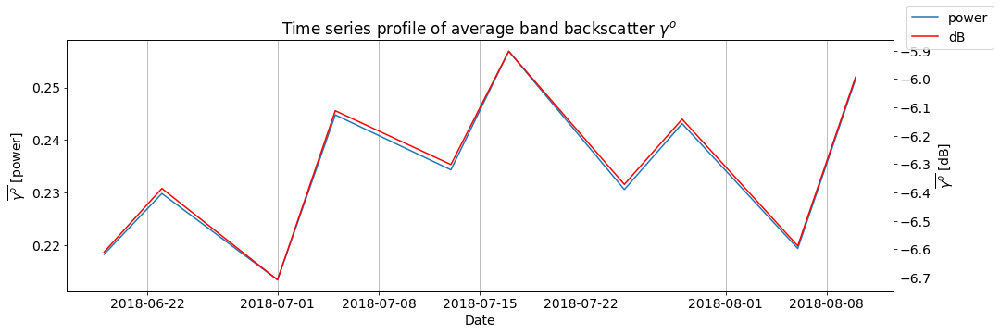

In [93]:
# 3. Now let's plot the time series of means
fig = plt.figure(figsize=(16, 5))
ax1 = fig.add_subplot(111)
ax1.plot(tindex, rs_means_pwr)
plt.rcParams.update({'font.size': 14})
ax1.set_xlabel('Date')
ax1.set_ylabel('$\overline{\gamma^o}$ [power]')
ax1.grid(axis='x')

ax2 = ax1.twinx()
plt.rcParams.update({'font.size': 14})
ax2.plot(tindex, rs_means_dB, color='red')
ax2.set_ylabel('$\overline{\gamma^o}$ [dB]')
fig.legend(['power', 'dB'], loc=1)
plt.title('Time series profile of average band backscatter $\gamma^o$ ')
plt.savefig('time_series_means', dpi=72, transparent='true')

## 5.5 Create Two-Panel Figure with Animated Global Mean $\mu_{\gamma^0_{dB}}$

<font face="Calibri" size="3"> We use a few Matplotlib functions to <b>create a side-by-side animation of the dB-scaled imagery and the respective global means $\mu_{\gamma^0_{dB}}$.</b> </font> 

In [94]:
%%capture 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5), gridspec_kw={'width_ratios':[1, 3]})
plt.rcParams.update({'font.size': 14})
vmin = np.percentile(rasterstack.flatten(), 5)
vmax = np.percentile(rasterstack.flatten(), 95)
im = ax1.imshow(raster0, cmap='gray', vmin=vmin, vmax=vmax)
ax1.set_title("{}".format(tindex[0].date()))
ax1.set_axis_off()

ax2.axis([tindex[0].date(), tindex[-1].date(), rs_means_dB.min(), rs_means_dB.max()])
plt.rcParams.update({'font.size': 14})
ax2.set_ylabel('$\overline{\gamma^o}$ [dB]')
ax2.set_xlabel('Date')
ax2.set_ylim((-10, -5))
ax2.grid()
l, = ax2.plot([], [])
plt.tight_layout()

def animate(i):
    ax1.set_title("{}".format(tindex[i].date()))
    im.set_data(rasterstack[i])
    ax2.set_title("{}".format(tindex[i].date()))
    l.set_data(tindex[:(i+1)], rs_means_dB[:(i+1)])

# Interval is given in milliseconds
ani = an.FuncAnimation(fig, animate, frames=rasterstack.shape[0], interval=400)

NameError: name 'raster0' is not defined

<font face="Calibri" size="3"><b>Configure matplotlib's RC settings for the animation:</b></font>

In [95]:
HTML(ani.to_jshtml())

<font face="Calibri" size="3"><b>Save the animated time-series and histogram (animation_histogram.gif):</b></font>

In [96]:
ani.save('TSAnimation_means.gif', writer='pillow', fps=2)

# 6. Version Log

<font face="Calibri" size="2"> <i>GEOS 657 Microwave Remote Sensing - Version 1.3 - January 2021
    <br>
        <b>Version Changes:</b>
    <ul>
        <li>Revised assignments and formatting</li>
        <li>Capture matplotlib deprecation warnings in import cell</li>
        <li>Add --region=us-east-1 --no-sign-request to aws s3 cp call</li>
    </ul>
    </i>
</font>